In [ ]:
import pandas as pd
import requests
import base64
import json
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import seaborn as sns
from itertools import chain
from collections import Counter

# **Import Data from Kaggle and audd**

The Kaggle set stems from here: https://www.kaggle.com/datasets/paradisejoy/top-hits-spotify-from-20002019/data

The API for the lyrics can be found here: https://audd.io/


In [ ]:
df = pd.read_csv("/songs_normalize.csv")

df.head()

kaggle_set = df.loc[:,['artist', 'song', 'year', 'genre']]

kaggle_set.head()

,artist,song,year,genre
0,Britney Spears,Oops!...I Did It Again,2000,pop
1,blink-182,All The Small Things,1999,"rock, pop"
2,Faith Hill,Breathe,1999,"pop, country"
3,Bon Jovi,It's My Life,2000,"rock, metal"
4,*NSYNC,Bye Bye Bye,2000,pop


In [ ]:
API_TOKEN = "1125e1e1ab856f6fcca02cc77c760a79"

df2 = pd.DataFrame([], columns=['song_id', 'song', 'song_artist', 'lyrics'])
count = 0

for i in kaggle_set.loc[:,'song']:
  count += 1
  song_title = i
  # artist_name = kaggle_set

  url = "https://api.audd.io/findLyrics/"
  params = {
      "q": f"{song_title}",
      "api_token": API_TOKEN
  }

  response = requests.get(url, params=params)
  data = response.json()
  print(data)
  if data['result']:
    # print(data)
    relevent_data = data['result'][0]['song_id']
    # print(relevent_data)
    new_entry = [data['result'][0]['song_id'], data['result'][0]['title'], data['result'][0]['artist'], data['result'][0]['lyrics']]
    print(new_entry)
    df2.loc[len(df2)] = new_entry

  if (count == 500): # limit the amount of requests
    break



df2 = df2.set_index('song_id')
df2.head()

{'status': 'success', 'result': [{'song_id': '3988', 'artist_id': '1052', 'title': 'Oops!... I Did It Again', 'title_with_featured': 'Oops!... I Did It Again', 'full_title': 'Oops!... I Did It Again by\xa0Britney\xa0Spears', 'artist': 'Britney Spears', 'lyrics': '[Intro]\nYeah, yeah\nYeah, yeah, yeah, yeah, yeah, yeah\nYeah, yeah, yeah, yeah, yeah, yeah\n\n[Verse 1]\nI think I did it again\nI made you believe we\'re more than just friends, oh, baby\nIt might seem like a crush\nBut it doesn\'t mean that I\'m serious\n\n[Pre-Chorus]\n\'Cause to lose all my senses\nThat is just so typically me, ooh, baby, baby\n\n[Chorus]\nOops!... I did it again\nI played with your heart\nGot lost in the game\nOh, baby, baby\nOops, you think I\'m in love\nThat I\'m sent from above\nI\'m not that innocent\n\n[Verse 2]\nYou see, my problem is this, I\'m dreaming away\nWishing that heroes, they truly exist\nI cry watching the days\nCan\'t you see I\'m a fool in so many ways?\n[Pre-Chorus]\nBut to lose all m

,song,song_artist,lyrics
song_id,,,
3988,Oops!... I Did It Again,Britney Spears,"[Intro]\nYeah, yeah\nYeah, yeah, yeah, yeah, y..."
62154,All the Small Things,​​blink-182,"[Verse 1: Tom DeLonge]\nAll the small things, ..."
72119,Breathe (In the Air),Pink Floyd,"[Intro]\n\n[Verse 1]\nBreathe, breathe in the ..."
203021,It’s My Life,Bon Jovi,[Verse 1]\nThis ain't a song for the broken-he...
115478,Bye Bye Bye,*NSYNC,"[Intro: 'N Sync]\nHey, hey\nBye, bye, bye\nBye..."


In [ ]:
df2.rename(columns={'song_name': 'song', 'song_artist': 'artist'}, inplace=True)
df2.head()

,song,artist,lyrics
song_id,,,
3988,Oops!... I Did It Again,Britney Spears,"[Intro]\nYeah, yeah\nYeah, yeah, yeah, yeah, y..."
62154,All the Small Things,​​blink-182,"[Verse 1: Tom DeLonge]\nAll the small things, ..."
72119,Breathe (In the Air),Pink Floyd,"[Intro]\n\n[Verse 1]\nBreathe, breathe in the ..."
203021,It’s My Life,Bon Jovi,[Verse 1]\nThis ain't a song for the broken-he...
115478,Bye Bye Bye,*NSYNC,"[Intro: 'N Sync]\nHey, hey\nBye, bye, bye\nBye..."


In [ ]:
new_df = pd.merge(kaggle_set, df2, on=['song', 'artist'])

In [ ]:
new_df.head(10)

,artist,song,year,genre,lyrics
0,*NSYNC,Bye Bye Bye,2000,pop,"[Intro: 'N Sync]\nHey, hey\nBye, bye, bye\nBye..."
1,Eminem,The Real Slim Shady,2000,hip hop,"[Intro]\nMay I have your attention, please?\nM..."
2,Robbie Williams,Rock DJ,2000,"pop, rock",[Verse 1]\nMe with the floor show kicking with...
3,Sting,Desert Rose,1999,"rock, pop",[Intro: Cheb Mami]\nHathe mada tawila\nWa ana ...
4,Linkin Park,In the End,2000,"rock, metal",[Verse 1: Mike Shinoda &amp; Chester Benningto...
5,Linkin Park,In the End,2000,"rock, metal",[Verse 1: Mike Shinoda &amp; Chester Benningto...
6,Sonique,It Feels So Good,2000,pop,[Verse 1]\nYou always make me smile\nWhen I'm ...
7,Darude,Sandstorm,2001,"pop, Dance/Electronic",[Verse]\nDuuuuuuuuuuuuuuuuuuuuuuun\nDun dun du...
8,Britney Spears,Born to Make You Happy,1999,pop,"[Intro]\nOh, my love\nOh, yeah, yeah\nOh, yeah..."
9,Montell Jordan,Get It On Tonite,1999,"hip hop, pop, R&B","[Intro]\nOh, ooh wee oh, oh\n\n[Verse 1]\nWhen..."


In [ ]:
new_df.sort_values(by='genre')

,artist,song,year,genre,lyrics
43,Roger Sanchez,Another Chance,2000,Dance/Electronic,If I had another chance tonight\nI'd try to te...
57,So Solid Crew,21 Seconds,2001,Dance/Electronic,"Ha, ha, ha, whatcha laughin at?\n\n[Verse 1:Me..."
63,Vanessa Carlton,A Thousand Miles,2002,"Folk/Acoustic, pop",[Intro]\n\n[Verse 1]\nMakin' my way downtown\n...
16,Oasis,Go Let It Out,2000,"Folk/Acoustic, rock","[Verse 1]\nPaint no illusion, try to click wit..."
14,Mary Mary,Shackles (Praise You),2000,R&B,"[Spoken Intro: Warryn Campbell]\nWhew, it sure..."
...,...,...,...,...,...
97,Coldplay,In My Place,2002,"rock, pop","[Verse 1]\nIn my place, in my place\nWere line..."
26,Fuel,Hemorrhage (In My Hands),2000,"rock, pop, metal",[Verse 1]\nMemories are just where you leave t...
94,Default,Wasting My Time,2001,"rock, pop, metal",I don't want to see you waiting\nI've already ...
172,Milky Chance,Stolen Dance,2014,set(),[Verse 1]\nI want you by my side\nSo that I ne...


# **Data Analysis**

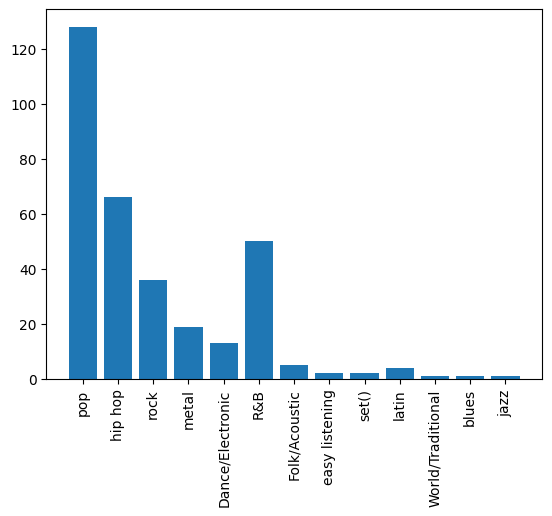

<Figure size 780x400 with 0 Axes>

In [ ]:
fig, ax = plt.subplots()

# groups = new_df.loc[:, 'genre']

# counts = new_df['genre'].value_counts()



def split_and_flatten(lst):
    result = []
    for item in lst:
        # Split by comma, strip whitespace, and add each to result
        parts = [part.strip() for part in item.split(",")]
        result.extend(parts)
    return result


flattened_genres = split_and_flatten(list(new_df['genre']))

counts = Counter(flattened_genres)

labels = list(counts.keys())
values = list(counts.values())

width_per_category = 0.6
plt.bar(labels, values)

fig_width = max(6, width_per_category * len(labels))  # minimum width of 6
plt.xticks(rotation=90)  # or 60, or 90

plt.figure(figsize=(fig_width, 4))  # height is constant

plt.show()

In [ ]:
new_df.loc[new_df['genre'] == 'set()']



,artist,song,year,genre,lyrics
31,Wheatus,Teenage Dirtbag,1999,set(),[Verse 1]\nHer name is Noelle\nI have a dream ...
172,Milky Chance,Stolen Dance,2014,set(),[Verse 1]\nI want you by my side\nSo that I ne...
